# Logistic Regression pipeline

In [1]:
import pandas as pd 

dataframe = pd.read_csv("SBAnational.csv", low_memory=False)
#dataframe.isna().sum()

## 1. Convert data types

In [2]:
dataframe.dtypes

LoanNr_ChkDgt          int64
Name                  object
City                  object
State                 object
Zip                    int64
Bank                  object
BankState             object
NAICS                  int64
ApprovalDate          object
ApprovalFY            object
Term                   int64
NoEmp                  int64
NewExist             float64
CreateJob              int64
RetainedJob            int64
FranchiseCode          int64
UrbanRural             int64
RevLineCr             object
LowDoc                object
ChgOffDate            object
DisbursementDate      object
DisbursementGross     object
BalanceGross          object
MIS_Status            object
ChgOffPrinGr          object
GrAppv                object
SBA_Appv              object
dtype: object

In [3]:
dataframe["RevLineCr"].value_counts()

RevLineCr
N    420288
0    257602
Y    201397
T     15284
1        23
R        14
`        11
2         6
C         2
3         1
,         1
7         1
A         1
5         1
.         1
4         1
-         1
Q         1
Name: count, dtype: int64

In [4]:
import conversion_functions as conv
import math

print (f"Before : {dataframe.shape[0]} lines")

explanable_X = pd.DataFrame(dataframe)

explanable_X["State"] = explanable_X["State"].apply(lambda x : conv.get_state_code(x))
#explanable_X = explanable_X[explanable_X["State"]!=0]

explanable_X["NAICS"] = explanable_X["NAICS"].apply(lambda x : conv.get_NAICS_data(x))
#explanable_X = explanable_X[explanable_X["NAICS"]!=0]

explanable_X["ApprovalFY"] = explanable_X["ApprovalFY"].apply(lambda x : conv.get_ApprovalFY_data(x)) 
mean_dataframe = explanable_X[ explanable_X["ApprovalFY"] !=50]
mean_value = mean_dataframe["ApprovalFY"].mean()
explanable_X.loc[explanable_X['ApprovalFY'] == 50, 'ApprovalFY'] = math.ceil(mean_value)

explanable_X["NewExist"] = explanable_X["NewExist"].apply(lambda x : conv.get_NewExist_data(x)) 
explanable_X["FranchiseCode"] = explanable_X["FranchiseCode"].apply(lambda x : conv.get_FranchiseCode_data(x)) 

explanable_X = explanable_X.drop("UrbanRural", axis=1)

explanable_X["RevLineCr"] = explanable_X["RevLineCr"].apply(lambda x : conv.get_RevLineCr_data(x)) 
explanable_X["LowDoc"] = explanable_X["LowDoc"].apply(lambda x : conv.get_LowDoc_data(x)) 

explanable_X["GrAppv"] = explanable_X["GrAppv"].apply(lambda x : conv.get_GrAppv_value(x)) 
mean_dataframe = explanable_X[ explanable_X["GrAppv"] !=0]
mean_value = mean_dataframe["GrAppv"].mean()
explanable_X.loc[explanable_X['GrAppv'] == 0, 'ApprovalFY'] = math.ceil(mean_value)

explanable_X = explanable_X[ explanable_X["GrAppv"] !=0] 

explanable_X = explanable_X.drop("SBA_Appv", axis = 1)
# explanable_X["SBA_Appv"] = explanable_X["SBA_Appv"].apply(lambda x : conv.get_SBA_Appv_value(x)) 
# explanable_X = explanable_X[ explanable_X["SBA_Appv"] !=0] 

explanable_X['MIS_Status'] = explanable_X.apply(lambda row: conv.predict_MIS_Status_data(row), axis=1 )
explanable_X["MIS_Status"] = explanable_X["MIS_Status"].apply(lambda x : conv.get_MIS_Status_data(x))

print (f"After : {explanable_X.shape[0]} lines")


Before : 899164 lines
After : 899164 lines


In [5]:
explanable_X.dtypes

LoanNr_ChkDgt         int64
Name                 object
City                 object
State                 int64
Zip                   int64
Bank                 object
BankState            object
NAICS                 int64
ApprovalDate         object
ApprovalFY            int64
Term                  int64
NoEmp                 int64
NewExist              int64
CreateJob             int64
RetainedJob           int64
FranchiseCode         int64
RevLineCr             int64
LowDoc                int64
ChgOffDate           object
DisbursementDate     object
DisbursementGross    object
BalanceGross         object
MIS_Status           object
ChgOffPrinGr         object
GrAppv                int64
dtype: object

## 2. Explore data

In [6]:
# requires pip install ydata-profiling
# requires pip install setup-tools
# pip install ipywidgets
# and the VS package Python Task Provider
import ydata_profiling
from ydata_profiling import ProfileReport

profile = ProfileReport(
    explanable_X,
    title="Simplon_Data SBA Loan Data Analysis",
    dataset={
        "description": "This profiling report was copied from 2025 Misiriya's KaggleX BIPOC project",
        "copyright_year": "2025",
    },)
#output the profile
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
#Save the Profile Report. This can be done to a json file or an html file. Let's save it to an html file.
#profile.to_file("SBA_Dataset_Analysis.html")
profile.to_file("Start_Analysis.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## 3. Drop columns

In [9]:
import MIS_Status_reference as mis_ref

X = explanable_X.drop('LoanNr_ChkDgt', axis=1)
X = X.drop('Name', axis=1)
X = X.drop('City', axis=1)
# State included
X = X.drop('Zip', axis=1)
X = X.drop('Bank', axis=1)
X = X.drop('BankState', axis=1)
# NAICS included (2 first chars )
X = X.drop('ApprovalDate', axis=1)
# ApprovalFY included 
# Term (nombre de mois - à mettre en rapport avec le GrAppv ?) included
# NoEmp, NewExist , CreateJob, RetainedJob, FranchiseCode, UrbanRural, RevLineCr include 
# LowDoc (include 'y' only) included
X = X.drop('ChgOffDate', axis=1) # (explicit end on simulation?) : included 
X = X.drop('DisbursementDate', axis=1)  
X = X.drop('DisbursementGross', axis=1)  
X = X.drop('BalanceGross', axis=1)  # 14 valeurs seulement différentes de zéro  ?
# MIS_Status : INCLUDED !!! because it is Y
X = X.drop('ChgOffPrinGr', axis=1)
# GrAppv : included
# SBA_Appv : included

X["MIS_Status"] =X["MIS_Status"].apply(lambda x : mis_ref.convert_MIS_Status_to_int(x))

# print(f"lines : {y.value_counts().sum()}")
# print(y.value_counts())

X.dtypes

State            int64
NAICS            int64
ApprovalFY       int64
Term             int64
NoEmp            int64
NewExist         int64
CreateJob        int64
RetainedJob      int64
FranchiseCode    int64
RevLineCr        int64
LowDoc           int64
MIS_Status       int64
GrAppv           int64
dtype: object

In [10]:
# requires pip install ydata-profiling
# requires pip install setup-tools
# pip install ipywidgets
# and the VS package Python Task Provider
import ydata_profiling
from ydata_profiling import ProfileReport

profile = ProfileReport(
    X,
    title="Simplon_Data SBA Loan Data Analysis",
    dataset={
        "description": "This profiling report was copied from 2025 Misiriya's KaggleX BIPOC project",
        "copyright_year": "2025",
    },)
#output the profile
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
#Save the Profile Report. This can be done to a json file or an html file. Let's save it to an html file.
#profile.to_file("SBA_Dataset_Analysis.html")
profile.to_file("RemoveColums_Analysis.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## 4. Create pipeline

In [12]:
import numpy as np
import pandas as pd 

from sklearn.pipeline import make_pipeline, make_union
from sklearn.compose import make_column_transformer

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, RobustScaler, OrdinalEncoder, LabelBinarizer, OneHotEncoder, Binarizer, FunctionTransformer, PolynomialFeatures,MinMaxScaler



In [13]:
preprocessor = make_pipeline(
    make_column_transformer(
        # LoanNr_ChkDgt, Name , City : excluded
        (OneHotEncoder(), ["State"]), 
        # Zip , Bank , BankState : excluded
        (OneHotEncoder(), ["NAICS"]), #included (2 first chars )
        # ApprovalDate : excluded
        (StandardScaler(), ["ApprovalFY"]),
        (StandardScaler(), ["Term"]), 
        (StandardScaler(), ["NoEmp"]),
        (StandardScaler(), ["NewExist"]),
        (StandardScaler(), ["CreateJob"]),
        (StandardScaler(), ["RetainedJob"]),
        (Binarizer(), ["FranchiseCode"]),
        #Binarizer("UrbanRural", threshold=1.5),
        (OneHotEncoder(), ["RevLineCr"]),
        (Binarizer(), ["LowDoc"]),
        # SimpleImputer("ChgOffDate"), # explicit end on simulation
        # DisbursementDate, DisbursementGross , BalanceGross ( 14 valeurs seulement différentes de zéro  ?)
        # MIS_Status : Excluded because it is Y !!!
        # ChgOffPrinGr : excluded
        (StandardScaler(), ["GrAppv"]), 
        #(StandardScaler(),["SBA_Appv"]),  
        remainder='passthrough'))

In [14]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

log_reg_model = LogisticRegression(max_iter=200,
    # Entraînement du modèle avec C faible (plus de régularisation) 
    # et class_weight='balanced' pour favoriser la précision
    C=0.1, class_weight='balanced',  
    # Le solver 'lbfgs' et la régularisation L2 
    # favorisent aussi la précision
    solver='lbfgs', penalty='l2')

pipeline = Pipeline([
    ('preprocessor', preprocessor), 
    ('model', log_reg_model)])

pipeline


Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('columntransformer',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('onehotencoder-1',
                                                                   OneHotEncoder(),
                                                                   ['State']),
                                                                  ('onehotencoder-2',
                                                                   OneHotEncoder(),
                                                                   ['NAICS']),
                                                                  ('standardscaler-1',
                                                                   StandardScaler(),
                                                                   ['ApprovalFY']),
                                                                  ('standardscaler-2',
                                                                   StandardScaler(),
                                                                   ['Term']),
                                                                  ('standardscaler-3',
                                                                   StandardScale...
                                                                   StandardScaler(),
                                                                   ['CreateJob']),
                                                                  ('standardscaler-6',
                                                                   StandardScaler(),
                                                                   ['RetainedJob']),
                                                                  ('binarizer-1',
                                                                   Binarizer(),
                                                                   ['FranchiseCode']),
                                                                  ('onehotencoder-3',
                                                                   OneHotEncoder(),
                                                                   ['RevLineCr']),
                                                                  ('binarizer-2',
                                                                   Binarizer(),
                                                                   ['LowDoc']),
                                                                  ('standardscaler-7',
                                                                   StandardScaler(),
                                                                   ['GrAppv'])]))])),
                ('model',
                 LogisticRegression(C=0.1, class_weight='balanced',
                                    max_iter=200))])

In [15]:
from sklearn.model_selection import train_test_split

y = X["MIS_Status"]
X = X.drop("MIS_Status", axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.3, random_state=42, stratify=y)

pipeline.fit(X_train, y_train)



Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('columntransformer',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('onehotencoder-1',
                                                                   OneHotEncoder(),
                                                                   ['State']),
                                                                  ('onehotencoder-2',
                                                                   OneHotEncoder(),
                                                                   ['NAICS']),
                                                                  ('standardscaler-1',
                                                                   StandardScaler(),
                                                                   ['ApprovalFY']),
                                                                  ('standardscaler-2',
                                                                   StandardScaler(),
                                                                   ['Term']),
                                                                  ('standardscaler-3',
                                                                   StandardScale...
                                                                   StandardScaler(),
                                                                   ['CreateJob']),
                                                                  ('standardscaler-6',
                                                                   StandardScaler(),
                                                                   ['RetainedJob']),
                                                                  ('binarizer-1',
                                                                   Binarizer(),
                                                                   ['FranchiseCode']),
                                                                  ('onehotencoder-3',
                                                                   OneHotEncoder(),
                                                                   ['RevLineCr']),
                                                                  ('binarizer-2',
                                                                   Binarizer(),
                                                                   ['LowDoc']),
                                                                  ('standardscaler-7',
                                                                   StandardScaler(),
                                                                   ['GrAppv'])]))])),
                ('model',
                 LogisticRegression(C=0.1, class_weight='balanced',
                                    max_iter=200))])

In [16]:
score = pipeline.score(X_test, y_test)
print(f'Score (Accuracy) du modèle : {score:.2f}')

Score (Accuracy) du modèle : 0.72


Nombre d'échantillons du test : 269750
Accuracy (Score) : 71.90%
Precision : 94.87% 
Recall : 69.69%
Macro F1 Score : 65.52%
Matrice de confusion :
[[ 38963   8383]
 [ 67416 154988]]


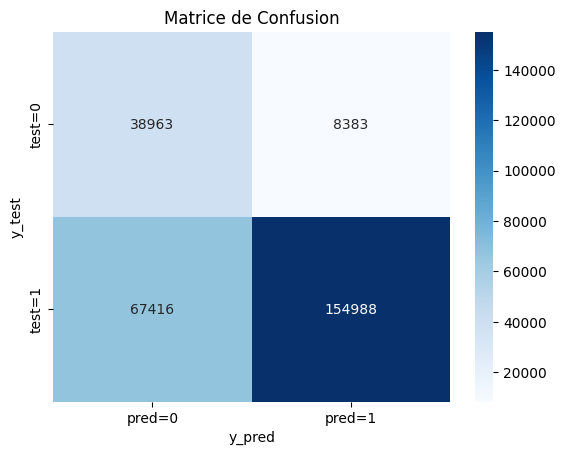

              precision    recall  f1-score   support

           0       0.37      0.82      0.51     47346
           1       0.95      0.70      0.80    222404

    accuracy                           0.72    269750
   macro avg       0.66      0.76      0.66    269750
weighted avg       0.85      0.72      0.75    269750



In [17]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Faire des prédictions sur l'ensemble de test
y_pred = pipeline.predict(X_test)

num_ech = y_test.shape[0]
print(f"Nombre d'échantillons du test : {num_ech}")

# Évaluer la performance du modèle
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
macro_f1 = f1_score(y_test, y_pred, average='macro')
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy (Score) : {100*accuracy:.2f}%")
print(f"Precision : {100*precision :.2f}% ")
print(f"Recall : {100*recall:.2f}%")
print(f"Macro F1 Score : {100*macro_f1:.2f}%")
print("Matrice de confusion :")
print(conf_matrix)


# Affichage avec Seaborn (optionnel)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['pred=0', 'pred=1'], yticklabels=['test=0', 'test=1'])
plt.xlabel('y_pred')
plt.ylabel('y_test')
plt.title('Matrice de Confusion')
plt.show()

from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))



In [18]:
# Importance des features
log_reg:LogisticRegression = pipeline.named_steps['model']

# Récupérer les coefficients de la régression logistique

columnTransformer:ColumnTransformer  = pipeline.named_steps['preprocessor'][0]

# Afficher les colonnes transformées

feature_names = []
remainder_num=0
for transformer_name, transformer, columns in columnTransformer.transformers_:
    if str(transformer_name).startswith("onehotencoder") :
        num = 0
        onehot:OneHotEncoder = transformer
        column_name = columns[0]
        for n in transformer.get_feature_names_out():
            feature_names.append(f"{columns[0]}_{num}")
            num+=1
    else :
        if len(columns) == 1 :
            name = columns[0]
            # if name == "Term" :
            #     name = "Echéance"
            
            feature_names.append(name) 
        else:
            num = 0
            for column in columns : 
                feature_names.append(f"other_{column}_{num}")
                num+=1
            

coefficients = log_reg.coef_[0]

print(f"feature names : {len(feature_names)}")
print(f"Coefficients : {len(coefficients)}")


feature names : 90
Coefficients : 90


In [19]:

# Créer un DataFrame avec les features et leurs coefficients
feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

# Trier par coefficient (en valeur absolue) pour voir les features les plus importantes
feature_importance['AbsCoefficient'] = feature_importance['Coefficient'].abs()
feature_importance_sorted = feature_importance.sort_values(by='AbsCoefficient', ascending=False)

# Afficher les résultats
#print(feature_importance_sorted[['Feature', 'Coefficient']])

# afficher les résultats sans le state et le naics

#selection = feature_importance_sorted[ ~(feature_importance_sorted["Feature"].str.startswith("State") | feature_importance_sorted["Feature"].str.startswith("NAICS") )]
selection = feature_importance_sorted

print(selection[['Feature', 'Coefficient']])
   


     Feature  Coefficient
78      Term     1.719080
54   NAICS_2     1.006266
88    LowDoc     0.906095
26  State_26     0.785935
10  State_10    -0.764623
..       ...          ...
20  State_20     0.014390
69  NAICS_17     0.008043
52   NAICS_0     0.006731
15  State_15     0.004891
70  NAICS_18    -0.002359

[90 rows x 2 columns]


In [20]:
import shap

# need ipywidget and matplotlib
transformed_X_train = pipeline.named_steps['preprocessor'].transform(X_train)

# Initialiser SHAP explainer
# Créer un explainer avec LinearExplainer en passant le modèle et les feature_names
explainer = shap.LinearExplainer(pipeline.named_steps['model'], transformed_X_train, feature_names=feature_names)


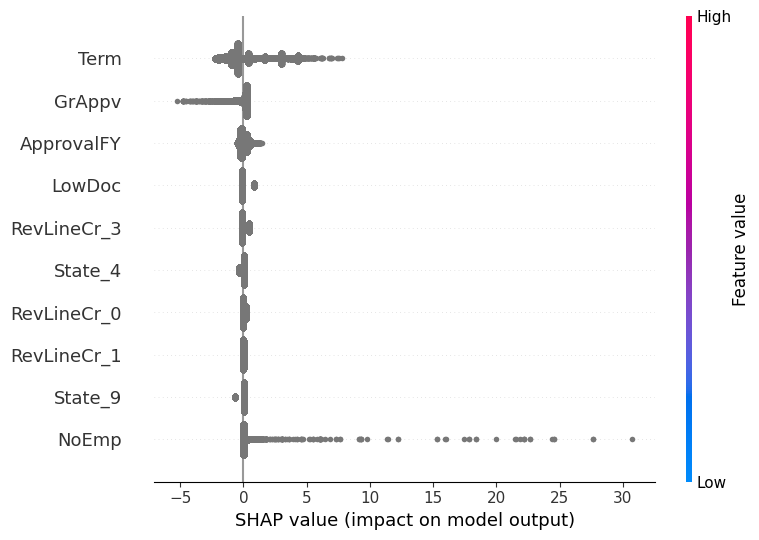

In [21]:
transformed_X_test = pipeline.named_steps['preprocessor'].transform(X_test)

# Calcul des SHAP values sur le jeu de test
shap_values = explainer.shap_values(transformed_X_test)

# Affichage du summary plot
shap.summary_plot(shap_values, transformed_X_test, feature_names=feature_names, max_display=10)

In [ ]:
transformed_X_test

In [45]:
# to do next ...

# # Récupérer les valeurs SHAP pour la 42e instance
# shap_values_instance = shap_values[42]  # Cela pourrait être une liste si tu as plusieurs classes

# # Modèle binaire, shap_values_instance sera un tableau 1D
# shap_values_instance = shap_values_instance[0]

# # Créer un objet Explanation avec les bonnes valeurs
# shap_values_explanation = shap.Explanation(values=shap_values_instance,
#                                            base_values=explainer.expected_value,
#                                            data=transformed_X_test[42,:])


# # Maintenant, on peut utiliser la fonction waterfall
# shap.plots.waterfall(shap_values_explanation, max_display=14)